# Pycortex

Let's take a NIFTI file and map it to pycortex. This can't be hard... right?

In [1]:
%matplotlib inline

In [2]:
import os


In [6]:
import numpy as np
import matplotlib.pyplot as plt
import cortex
from cortex import mni
import nibabel as nib

Take note of this directory- this is where the pycortex files are stored

In [4]:
cortex.database.default_filestore

'/home/njchiang/github/pycortex/filestore/db'

First, let's verify that everything is installed correctly and that their sample data works

Failed to get connection
** (inkscape:20007): CRITICAL **: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:20007): CRITICAL **: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:20007): CRITICAL **: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


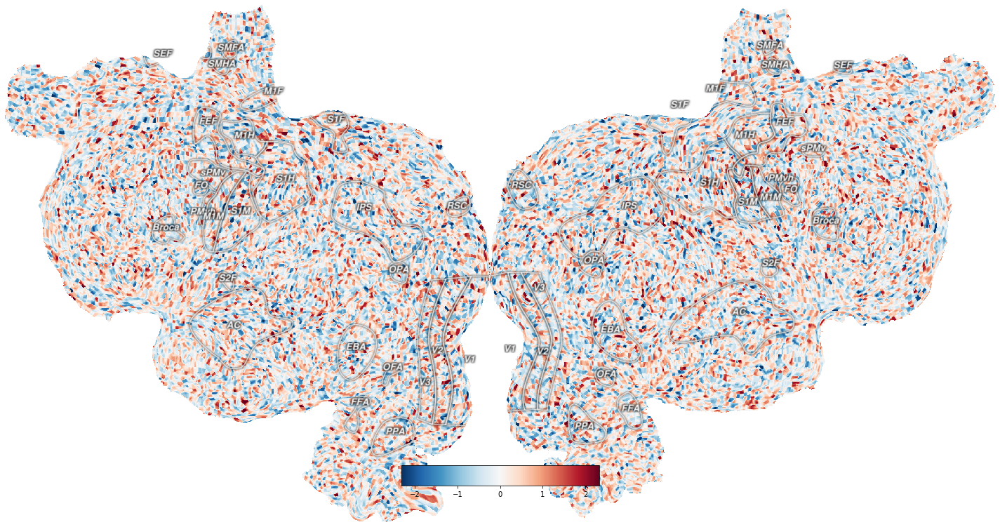

Failed to get connection
** (inkscape:20026): CRITICAL **: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:20026): CRITICAL **: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:20026): CRITICAL **: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


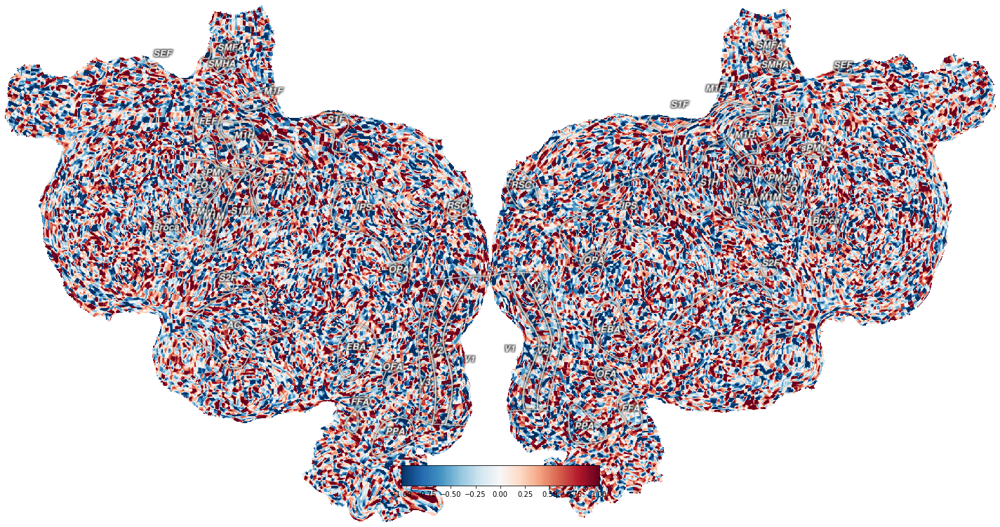

Failed to get connection
** (inkscape:20042): CRITICAL **: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:20042): CRITICAL **: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:20042): CRITICAL **: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


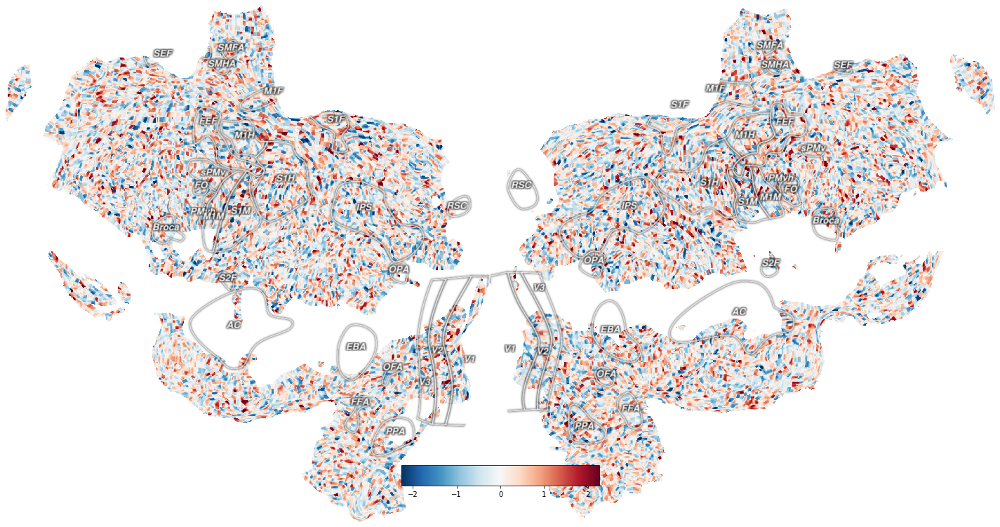

In [6]:
subject = 'S1'
xfm = 'fullhead'

# Creating a random dataset that is the shape for this transform with one
# entry for each voxel
test_data = np.random.randn(31, 100, 100)

# This creates a Volume object for our test dataset for the given subject
# and transform
vol_data = cortex.Volume(test_data, subject, xfm)
cortex.quickshow(vol_data)
plt.show()

# Can also alter the minimum and maximum values shown on the colorbar
vol_data_thresh = cortex.Volume(test_data, subject, xfm, vmin=-1, vmax=1)
cortex.quickshow(vol_data_thresh)
plt.show()

# If you have NaN values, those voxels show up transparent on the brain
test_data[10:15, :, :] = np.nan
vol_data_nan = cortex.Volume(test_data, subject, xfm)
cortex.quickshow(vol_data_nan)
plt.show()

# Using your own data

They have all of these fancy registration and importing functions. As far as I can tell, none of them work unless you work with vanilla freesurfer or fmriprep. Not too helpful. 

### BUT

The sample data they provide is in 1mm space, and they've helpfully provided surface maps as well as some ROI labels already! So really, to get anything plotted, we just need to register our maps to their 1mm space. There are some small caveats.

- For some reason their template image is in a weird orientation. Assuming you're in the fsl MNI standard, you can convert your images using the following.

```fslswapdim MNI152_T1_2mm_brain.nii.gz x -z y swapdim_MNI.nii.gz```

- You'll get a better registration on a brain-extracted image

``` bet /home/njchiang/github/pycortex/filestore/db/S1/anatomical/raw.nii.gz brainmask.nii.gz```

- Then, you can align your swapped MNI with their raw image

```flirt -in swapdim_MNI.nii.gz -ref brainmask.nii.gz -omat to_pycortex.mat```

There are two steps to getting your images into their space. 

1. ``` fslswapdim your_image.nii.gz x -z y swapdim_your_image.nii.gz ```

2. ``` flirt -in swapdim_your_image -out [out name] -ref brainmask.nii.gz -applyxfm -init to_pycortex.mat ```

In my case...

In [7]:
# %%bash
# fslswapdim MNI152_T1_2mm_brain.nii.gz x -z y swapdim_MNI.nii.gz
# flirt -in swapdim_MNI.nii.gz -ref brainmask.nii.gz -omat to_pycortex.mat
# for s in sub* 
# do 
#     fslswapdim ${s} x -z y swapdim/${s}
#     flirt -in swapdim/${s} \
#           -out swapdim/reg/${s} \
#           -ref ~/github/pycortex/filestore/db/S1/anatomicals/raw.nii.gz \
#           -applyxfm -init to_pycortex.mat ; 
# done

In [16]:

def plot_nifti(fname, thr=0, upper=0.2):
    subject = 'S1'
    xfm = 'identity'

    dat = nib.load(fname).get_data()
    dat[dat <= thr] = np.nan
    # Creating a random dataset that is the shape for this transform with one
    # entry for each voxel

    # This creates a Volume object for our test dataset for the given subject
    # and transform
    vol_data = cortex.Volume(dat, subject, xfm, vmin=thr, vmax=upper, cmap="autumn")
    cortex.quickshow(vol_data, with_curvature=True, curvature_threshold=True)
    plt.show()
    return vol_data


Failed to get connection
** (inkscape:22941): CRITICAL **: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:22941): CRITICAL **: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:22941): CRITICAL **: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


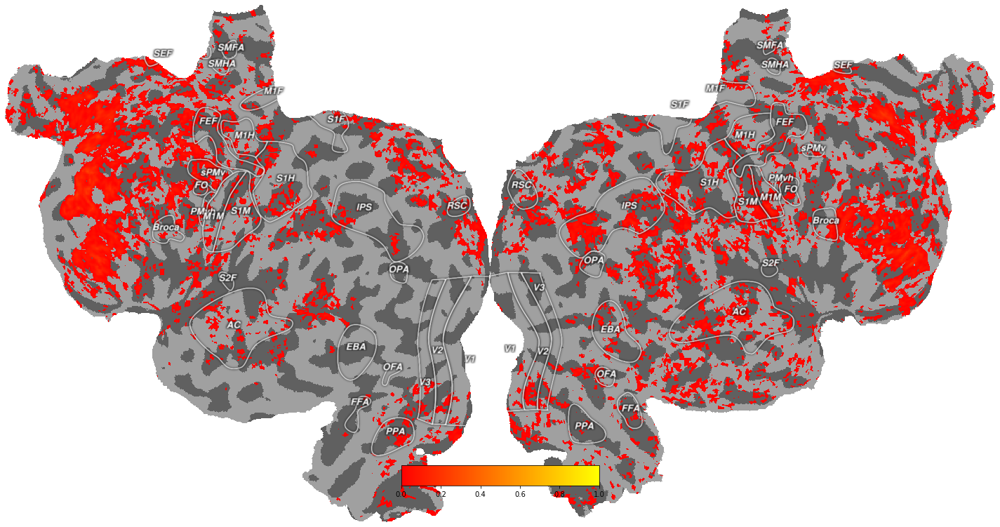

In [17]:
fname = "AB-BART-percentsig.nii.gz"
rootdir = "/home/njchiang/data/fmri/Analogy/analysis/group/encoding/vis/singlesubject-ab-encoding/swapdim/reg"

volume = plot_nifti(os.path.join(rootdir, fname), upper=1)

Since we brought it into their space, there's no need to do any further registration! Their `xfm` stuff is kind of broken. So, we can use the `identity` transform to directly visualize our images!

We can use their default subject name S1 because it is now our "standard" visualization space

Failed to get connection
** (inkscape:22957): CRITICAL **: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:22957): CRITICAL **: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:22957): CRITICAL **: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


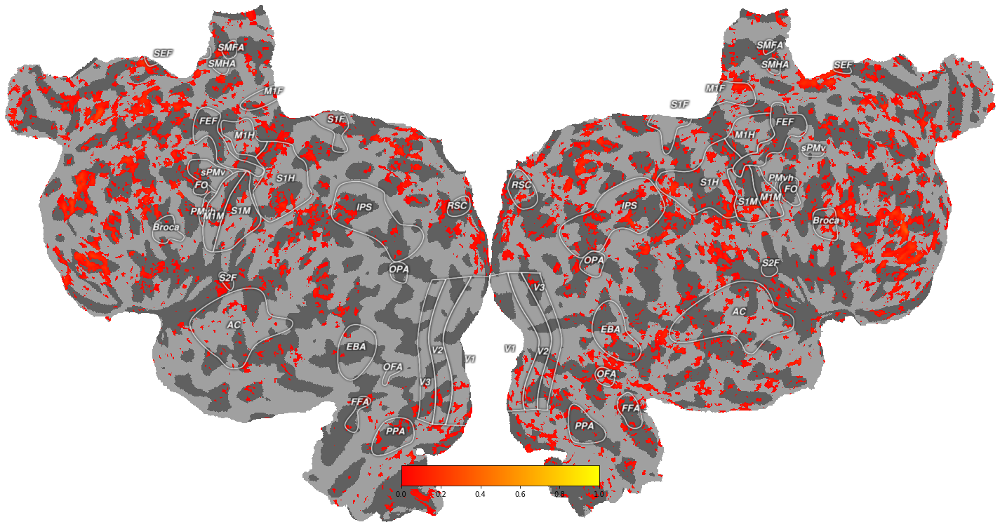

In [18]:

fname = "sub-0015.nii.gz"
rootdir = "/home/njchiang/data/fmri/Analogy/analysis/group/encoding/vis/singlesubject-ab-encoding/swapdim/reg"

volume = plot_nifti(os.path.join(rootdir, fname), upper=1)

In [ ]:
vol_data = cortex.Volume(dat, subject, xfm, vmin=0, vmax=.2, cmap="autumn")
cortex.quickshow(vol_data, with_curvature=True, curvature_contrast=0.2, curvature_brightness=0.5, curvature_threshold=True)
plt.show()


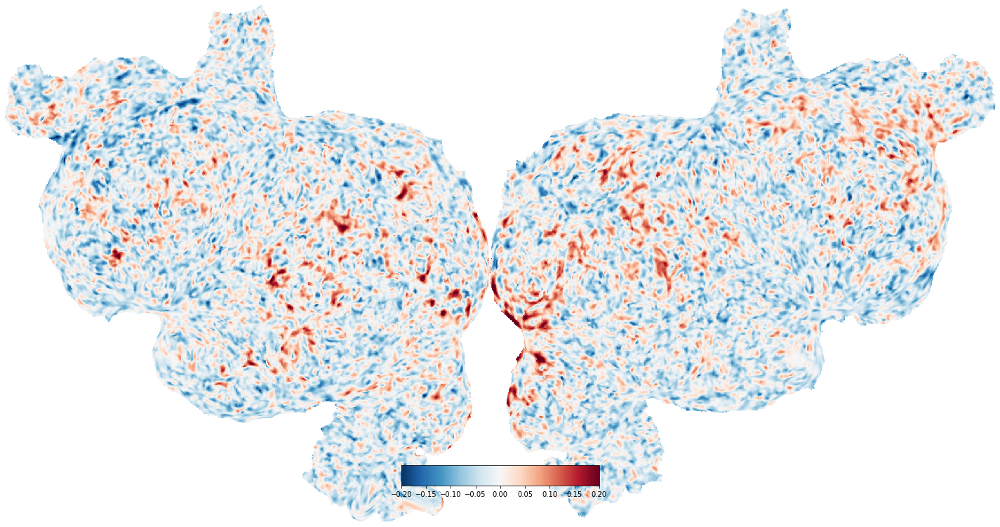

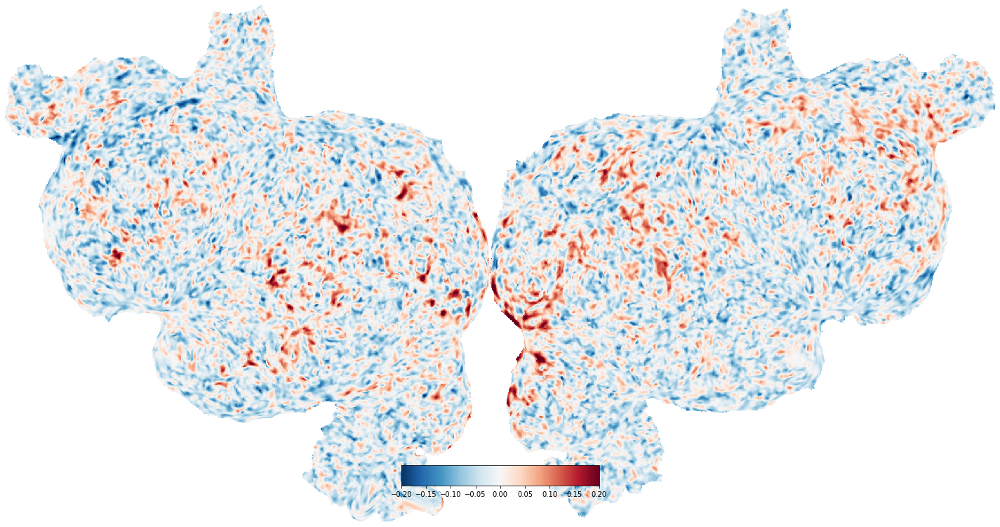

In [22]:
cortex.quickshow(vol_data, with_rois=False)
# plt.show()

In [17]:
cortex.webgl.show(data=vol_data, with_rois=False)


Generating new ctm file...
wm
wm
Generating curvature surface info...
inflated
inflated
Started server on port 17263


<JS: window.viewer>

Stopping server


In [55]:
from cortex.export import plot_panels, params_flatmap_lateral_medial, save_3d_views

params_flatmap_lateral_medial

{'figsize': [16, 9],
 'panels': [{'extent': [0.0, 0.2, 1.0, 0.8],
   'view': {'angle': 'flatmap', 'surface': 'flatmap'}},
  {'extent': [0.3, 0.0, 0.2, 0.2],
   'view': {'hemisphere': 'left',
    'angle': 'medial_pivot',
    'surface': 'inflated'}},
  {'extent': [0.5, 0.0, 0.2, 0.2],
   'view': {'hemisphere': 'right',
    'angle': 'medial_pivot',
    'surface': 'inflated'}},
  {'extent': [0.0, 0.0, 0.3, 0.3],
   'view': {'hemisphere': 'left',
    'angle': 'lateral_pivot',
    'surface': 'inflated'}},
  {'extent': [0.7, 0.0, 0.3, 0.3],
   'view': {'hemisphere': 'right',
    'angle': 'lateral_pivot',
    'surface': 'inflated'}}]}

In [54]:

# plot_panels(vol_data, **params_flatmap_lateral_medial)
# the better plot

base_name = "/home/njchiang/data/Downloads/"

panels = params_flatmap_lateral_medial["panels"]

angles_and_surfaces = [(panel['view']['angle'], panel['view']['surface'])
                           for panel in panels]
# remove redundant couples, e.g. left and right
angles_and_surfaces = list(set(angles_and_surfaces))
list_angles, list_surfaces = list(zip(*angles_and_surfaces))



filenames = save_3d_views(vol_data, base_name, list_angles=list_angles,
                              list_surfaces=list_surfaces, trim=True, 
                              viewer_params=dict(labels_visible=[], overlays_visible=[]),
                              size=(1600 * 4, 900 * 4))

Started server on port 13723
{'camera.azimuth': 180, 'camera.altitude': 90, 'camera.target': [0, 0, 0], 'surface.{subject}.unfold': 0.5, 'surface.{subject}.pivot': 180, 'surface.{subject}.shift': 10, 'surface.{subject}.specularity': 0}
{'camera.azimuth': 0, 'camera.altitude': 90, 'camera.target': [0, 0, 0], 'surface.{subject}.unfold': 0.5, 'surface.{subject}.pivot': 180, 'surface.{subject}.shift': 10, 'surface.{subject}.specularity': 0}


Exception in callback None()
handle: <Handle cancelled>
Traceback (most recent call last):
  File "/home/njchiang/miniconda3/envs/fmri/lib/python3.7/asyncio/events.py", line 88, in _run
    self._context.run(self._callback, *self._args)
  File "/home/njchiang/miniconda3/envs/fmri/lib/python3.7/site-packages/tornado/platform/asyncio.py", line 138, in _handle_events
    handler_func(fileobj, events)
  File "/home/njchiang/miniconda3/envs/fmri/lib/python3.7/site-packages/tornado/iostream.py", line 706, in _handle_events
    self._handle_write()
  File "/home/njchiang/miniconda3/envs/fmri/lib/python3.7/site-packages/tornado/iostream.py", line 965, in _handle_write
    self._write_buffer.advance(num_bytes)
  File "/home/njchiang/miniconda3/envs/fmri/lib/python3.7/site-packages/tornado/iostream.py", line 202, in advance
    assert 0 < size <= self._size
AssertionError


{'camera.azimuth': 180, 'camera.altitude': 0, 'camera.target': [0, 0, 0], 'surface.{subject}.unfold': 1, 'surface.{subject}.pivot': 180, 'surface.{subject}.shift': 0, 'surface.{subject}.specularity': 0}
Stopping server


IndexError: list index out of range

In [7]:
rootdir = "/home/njchiang/data/fmri/Analogy/analysis/group/encoding/vis/betas/reg"
r1 = nib.load(os.path.join(rootdir, "n1000-AB_3a_BARTnorm_tstat1.nii.gz"))
r2 = nib.load(os.path.join(rootdir, "n1000-AB_3f_BARTnorm_tstat1.nii.gz"))
r3 = nib.load(os.path.join(rootdir, "n1000-AB_3h_BARTnorm_tstat1.nii.gz"))
r4 = nib.load(os.path.join(rootdir, "n1000-AB_4b_BARTnorm_tstat1.nii.gz"))
r5 = nib.load(os.path.join(rootdir, "n1000-AB_4d_BARTnorm_tstat1.nii.gz"))
r6 = nib.load(os.path.join(rootdir, "n1000-AB_4g_BARTnorm_tstat1.nii.gz"))
r7 = nib.load(os.path.join(rootdir, "n1000-AB_8a_BARTnorm_tstat1.nii.gz"))
r8 = nib.load(os.path.join(rootdir, "n1000-AB_8b_BARTnorm_tstat1.nii.gz"))
r9 = nib.load(os.path.join(rootdir, "n1000-AB_8d_BARTnorm_tstat1.nii.gz"))

rel1 = (r1.get_data() + r2.get_data() + r3.get_data()) / 3
rel2 = (r4.get_data() + r5.get_data() + r6.get_data()) / 3
rel3 = (r7.get_data() + r8.get_data() + r9.get_data()) / 3

Failed to get connection
** (inkscape:22788): CRITICAL **: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:22788): CRITICAL **: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:22788): CRITICAL **: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


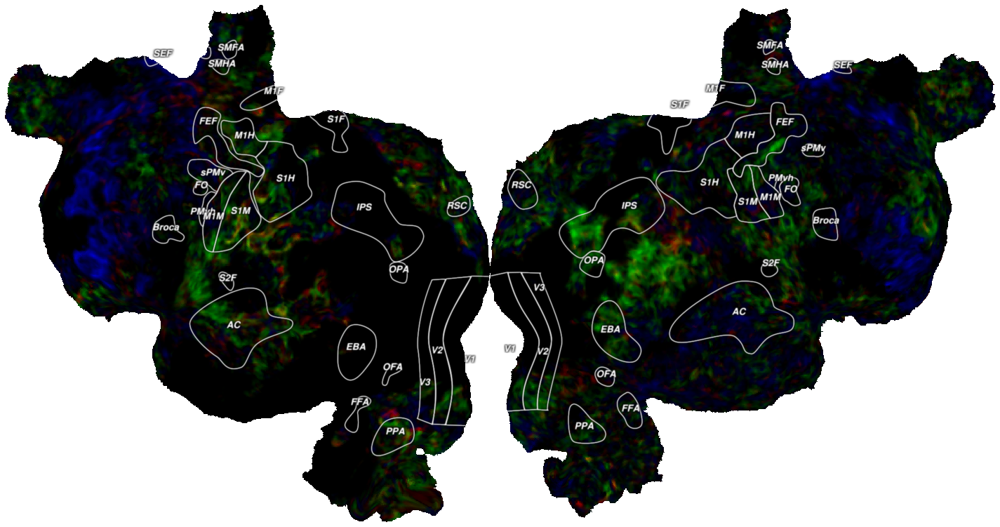

In [8]:
rel1_scaled = rel1 / np.max(rel1) * 255
rel2_scaled = rel2 / np.max(rel2) * 255
rel3_scaled = rel3 / np.max(rel3) * 255

rel1_scaled[rel1_scaled <= 0] = 0
rel2_scaled[rel2_scaled <= 0] = 0
rel3_scaled[rel3_scaled <= 0] = 0

red = cortex.Volume(rel1_scaled.astype(np.uint8), 'S1', 'identity')
green = cortex.Volume(rel2_scaled.astype(np.uint8), 'S1', 'identity')
blue = cortex.Volume(rel3_scaled.astype(np.uint8), 'S1', 'identity')

vol_data = cortex.VolumeRGB(red, green, blue, 'S1')

cortex.quickshow(vol_data, with_colorbar=False, with_curvature=True, curvature_contrast=0.2)
plt.show()

In [64]:
# cortex.webgl.show(data=vol_data, with_rois=False)

base_name = "/home/njchiang/data/Downloads/"

panels = params_flatmap_lateral_medial["panels"]

angles_and_surfaces = [(panel['view']['angle'], panel['view']['surface'])
                           for panel in panels]
# remove redundant couples, e.g. left and right
angles_and_surfaces = list(set(angles_and_surfaces))
list_angles, list_surfaces = list(zip(*angles_and_surfaces))



filenames = save_3d_views(vol_data, base_name, list_angles=list_angles,
                              list_surfaces=list_surfaces, trim=True, 
                              viewer_params=dict(labels_visible=[], overlays_visible=[]),
                              size=(1600 * 4, 900 * 4))

Started server on port 12437
{'camera.azimuth': 180, 'camera.altitude': 90, 'camera.target': [0, 0, 0], 'surface.{subject}.unfold': 0.5, 'surface.{subject}.pivot': 180, 'surface.{subject}.shift': 10, 'surface.{subject}.specularity': 0}
[Errno 22] Invalid argument
{'camera.azimuth': 0, 'camera.altitude': 90, 'camera.target': [0, 0, 0], 'surface.{subject}.unfold': 0.5, 'surface.{subject}.pivot': 180, 'surface.{subject}.shift': 10, 'surface.{subject}.specularity': 0}


Exception: Failed to execute 'createImageData' on 'CanvasRenderingContext2D': Out of memory at ImageData creation